### Import packages

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from tqdm import tqdm

### Use gpu if available

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


### Create DataLoader

In [3]:
# transform: normalize between -1 and 1 (because we are using tanh activation function)
transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

# load dataset
train_dataset = torchvision.datasets.MNIST(root='data', train=True, download=True, transform=transforms)
train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=64, shuffle=True)


### Vanilla GAN

#### Generator

In [4]:
class Generator(nn.Module):
    def __init__(self, noise_dim, img_dim):
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(noise_dim, 256),
            nn.ReLU(True),
            nn.Linear(256, 512),
            nn.ReLU(True),
            nn.Linear(512, 1024),
            nn.ReLU(True),
            nn.Linear(1024, img_dim),
            nn.Tanh()
        )

    def forward(self, x):
        return self.model(x)

#### Discriminator

In [5]:
class Discriminator(nn.Module):
    def __init__(self, img_dim):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(img_dim, 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.model(x)

### Craete Vanilla GAN

In [6]:
noise_dim = 100
img_dim = 28 * 28

# models
generator = Generator(noise_dim, img_dim).to(device)
discriminator = Discriminator(img_dim).to(device)

# optimizer
g_optimizer = torch.optim.Adam(generator.parameters(), lr=0.0002)
d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.0002)

# loss
criterion = nn.BCELoss()

### Utils

In [ ]:
import os
os.makedirs('vanilla_gan_FCN_output', exist_ok=True)

def show_generated_images(epoch, generator, fixed_noise):
    generator.eval()
    with torch.no_grad():
        fake = generator(fixed_noise).reshape(-1, 1, 28, 28)
        fake = fake *0.5 + 0.5
    
    grid = torchvision.utils.make_grid(fake, nrow=8)
    plt.figure(figsize=(8,8))
    plt.imshow(grid.permute(1, 2, 0).cpu().numpy())
    plt.axis('off')
    plt.title(f'Generated Images at Epoch {epoch}')
    plt.savefig(f'vanilla_gan_FCN_output/generated_images_epoch_{epoch}.png')
    plt.show()
    generator.train()

### Train

#### Generator Loss Using `real_labels` (Non-Saturating GAN Objective)

Calculating the generator loss (`g_loss`) against **`real_labels` (target = 1)** is a standard technique used to solve the **gradient saturation problem**, as described in GAN literature and f-GAN theory.

This section explains **why this works** and **how it connects to the GAN objective**.

---

#### 1. The Problem: Gradient Saturation

In the original GAN formulation, the generator minimizes:

    log(1 - D(G(z)))

Early in training:
- The discriminator is much stronger than the generator
- Fake samples are easy to detect
- Therefore:

    D(G(z)) ≈ 0

When `D(G(z))` is close to 0:
- `log(1 - D(G(z)))` becomes very flat
- Gradients become very small
- The generator receives almost no learning signal

This is called **gradient saturation**.

---

#### 2. The Solution: Non-Saturating Generator Objective

To avoid saturation, the generator is instead trained to **maximize**:

    log(D(G(z)))

Key idea:
- This objective produces strong gradients even when the discriminator is confident
- Learning becomes faster and more stable
- Both objectives lead to the same final equilibrium

This is known as the **non-saturating GAN loss**.

---

#### 3. How This Appears in Code (Binary Cross-Entropy Logic)

Binary Cross-Entropy (BCE) loss is:

    BCE(output, target) =
        - [target * log(output) + (1 - target) * log(1 - output)]

---

##### Case 1: Using `fake_labels` (target = 0)

    BCE = -log(1 - D(G(z)))

- Matches the original GAN objective
- Suffers from gradient saturation

---

##### Case 2: Using `real_labels` (target = 1)

    BCE = -log(D(G(z)))

- Minimizing this is equivalent to maximizing `log(D(G(z)))`
- Provides strong gradients
- Preferred in practice

---

#### 4. Summary of the Strategy

| Target Label | Objective | Training Behavior |
|-------------|----------|-------------------|
| 0 (Fake) | minimize log(1 - D(G(z))) | Saturating gradients |
| 1 (Real) | maximize log(D(G(z))) | Strong gradients |

---

#### Analogy

Imagine a student receiving only **pass/fail** feedback.
- If they fail everything, they don’t know how to improve  
  → like minimizing `log(1 - D)`

Instead, tell the student:
> “Try to score as high as possible.”

- Even low scores give useful feedback  
  → like maximizing `log(D(G(z)))`

This is why we compute generator loss using **`real_labels`**.

---

**Reference**

Summary: Early in learning, when G is poor, D can reject samples with high confidence because they are clearly different from the training data. In this case, log(1-D(G(z))) saturates. Rather than training G to minimize log(1 − D(G(z))) we can train G to maximize log(D(G(z))). This objective function results in the same fixed point of the dynamics of G and D but provides much stronger gradients early in learning. Ref: https://arxiv.org/pdf/1406.2661

The explanation above is based on the discussion of generator objective functions and the non-saturating heuristic found in the *f-GAN* paper. Specifically, this information is described in **Section 3.2** of the source.

📄 Read the original paper here:  
https://arxiv.org/pdf/1606.00709

In [8]:
def train_gan(train_dataloader, num_epochs, mode="one_one"):
    fixed_noise = torch.randn(64, noise_dim).to(device)

    for epoch in range(num_epochs):
        pbar = tqdm(train_dataloader, desc=f"Epoch {epoch+1}/{num_epochs}", leave=False)
        for i, (real_images, _) in enumerate(pbar):
            batch_size = real_images.shape[0]
            real_images = real_images.view(batch_size, -1).to(device)

            # real and fake labels
            real_labels = torch.ones(batch_size, 1).to(device)
            fake_labels = torch.zeros(batch_size, 1).to(device)

            # Train Discriminator
            outputs = discriminator(real_images)
            d_loss_real = criterion(outputs, real_labels)
            real_score = outputs

            z = torch.randn(batch_size, noise_dim).to(device)
            fake_images = generator(z)
            outputs = discriminator(fake_images.detach()) # Detach to avoid backpropagation through generator
            d_loss_fake = criterion(outputs, fake_labels)
            fake_score = outputs

            d_loss = d_loss_real + d_loss_fake
            discriminator.zero_grad()
            d_loss.backward() # BCELoss has a builtin -ve sign. So, gradient descent of BCELoss is equivalent to gradient ascent of our objective function J.
            d_optimizer.step()

            # Train Generator
            z = torch.randn(batch_size, noise_dim).to(device)
            fake_images = generator(z)
            outputs = discriminator(fake_images)
            g_loss = criterion(outputs, real_labels) # see above explanation

            generator.zero_grad()
            g_loss.backward()
            g_optimizer.step()

            if mode == "five_gen_one_dis":
                for _ in range(4): # already trained once above
                    z = torch.randn(batch_size, noise_dim).to(device)
                    fake_images = generator(z)
                    outputs = discriminator(fake_images.detach())
                    g_loss = criterion(outputs, real_labels)

                    generator.zero_grad()
                    g_loss.backward()
                    g_optimizer.step()

            if mode == "one_gen_five_dis":
                for _ in range(4):
                    outputs = discriminator(real_images)
                    d_loss_real = criterion(outputs, real_labels)

                    z = torch.randn(batch_size, noise_dim).to(device)
                    fake_images = generator(z)
                    outputs = discriminator(fake_images.detach()) # Detach to avoid backpropagation through generator
                    d_loss_fake = criterion(outputs, fake_labels)

                    d_loss = d_loss_real + d_loss_fake

                    discriminator.zero_grad()
                    d_loss.backward() # BCELoss has a builtin -ve sign. So, gradient descent of BCELoss is equivalent to gradient ascent of our objective function J.
                    d_optimizer.step()
        if (epoch+1) % 1 == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}], d_loss: {d_loss.item():.4f}, g_loss: {g_loss.item():.4f}")
            show_generated_images(epoch+1, generator, fixed_noise)       

### Run Training

training: 1-step Gen, 1-step Dis


Epoch [1/50], d_loss: 0.1018, g_loss: 4.7158


Epoch [2/50], d_loss: 0.7631, g_loss: 4.7621


Epoch [3/50], d_loss: 1.2257, g_loss: 1.5057


Epoch [4/50], d_loss: 1.4982, g_loss: 1.1445


Epoch [5/50], d_loss: 0.9425, g_loss: 1.4472


Epoch [6/50], d_loss: 0.7192, g_loss: 2.2659


Epoch [7/50], d_loss: 0.7814, g_loss: 2.5719


Epoch [8/50], d_loss: 0.5190, g_loss: 3.3557


Epoch [9/50], d_loss: 0.5464, g_loss: 3.2943


Epoch [10/50], d_loss: 0.4421, g_loss: 3.9587


Epoch [11/50], d_loss: 0.0954, g_loss: 5.0910


Epoch [12/50], d_loss: 0.1617, g_loss: 5.9312


Epoch [13/50], d_loss: 0.3538, g_loss: 9.1480


Epoch [14/50], d_loss: 0.0619, g_loss: 7.0151


Epoch [15/50], d_loss: 0.1002, g_loss: 9.5077


Epoch [16/50], d_loss: 0.0372, g_loss: 8.2454


Epoch [17/50], d_loss: 0.0388, g_loss: 10.7398


Epoch [18/50], d_loss: 0.5269, g_loss: 5.9366


Epoch [19/50], d_loss: 0.2372, g_loss: 6.1447


Epoch [20/50], d_loss: 0.3822, g_loss: 6.4503


C:\Users\BS01736\AppData\Local\Temp\ipykernel_28680\2639732952.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(8,8))


Epoch [21/50], d_loss: 0.3567, g_loss: 3.5635


Epoch [22/50], d_loss: 0.7661, g_loss: 3.4713


Epoch [23/50], d_loss: 0.4011, g_loss: 3.1656


Epoch [24/50], d_loss: 0.3326, g_loss: 5.3240


Epoch [25/50], d_loss: 0.3776, g_loss: 2.7281


Epoch [26/50], d_loss: 0.4988, g_loss: 1.5824


Epoch [27/50], d_loss: 0.6592, g_loss: 2.8915


Epoch [28/50], d_loss: 0.7178, g_loss: 1.8863


Epoch [29/50], d_loss: 0.6167, g_loss: 2.1378


Epoch [30/50], d_loss: 0.8264, g_loss: 2.2440


Epoch [31/50], d_loss: 0.6380, g_loss: 2.9926


Epoch [32/50], d_loss: 0.5001, g_loss: 2.4605


Epoch [33/50], d_loss: 0.4710, g_loss: 2.4561


Epoch [34/50], d_loss: 0.6682, g_loss: 2.3824


Epoch [35/50], d_loss: 0.5429, g_loss: 2.5676


Epoch [36/50], d_loss: 0.7340, g_loss: 2.2099


Epoch [37/50], d_loss: 0.5341, g_loss: 2.0247


Epoch [38/50], d_loss: 0.9797, g_loss: 1.4848


Epoch [39/50], d_loss: 0.8313, g_loss: 1.5186


Epoch [40/50], d_loss: 0.5618, g_loss: 2.4977


Epoch [41/50], d_loss: 1.1912, g_loss: 2.5997


Epoch [42/50], d_loss: 0.6628, g_loss: 2.6116


Epoch [43/50], d_loss: 0.5191, g_loss: 2.6030


Epoch [44/50], d_loss: 1.1284, g_loss: 1.9349


Epoch [45/50], d_loss: 0.8892, g_loss: 2.2332


Epoch [46/50], d_loss: 0.7380, g_loss: 2.2695


Epoch [47/50], d_loss: 0.9913, g_loss: 1.7668


Epoch [48/50], d_loss: 0.5600, g_loss: 1.9303


Epoch [49/50], d_loss: 0.9933, g_loss: 1.7106


Epoch [50/50], d_loss: 0.8957, g_loss: 1.6133


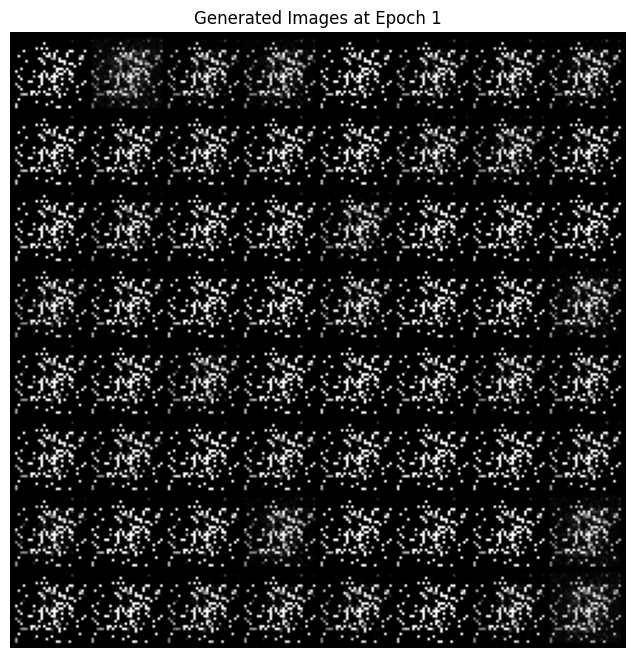

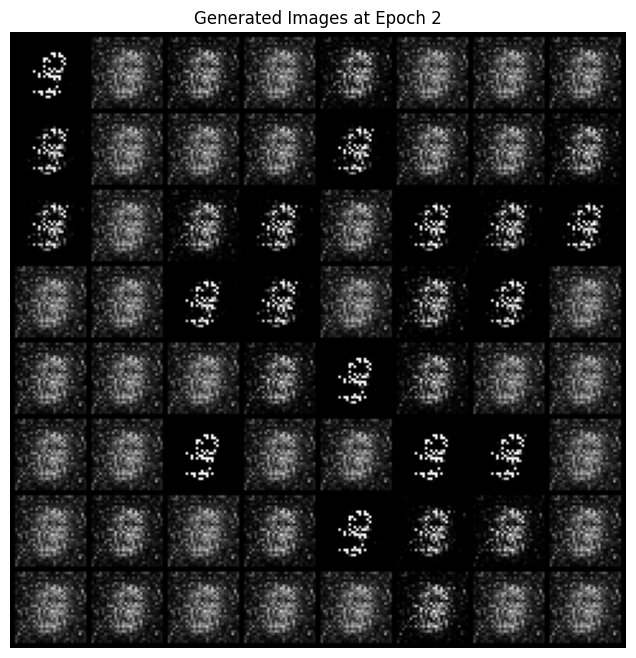

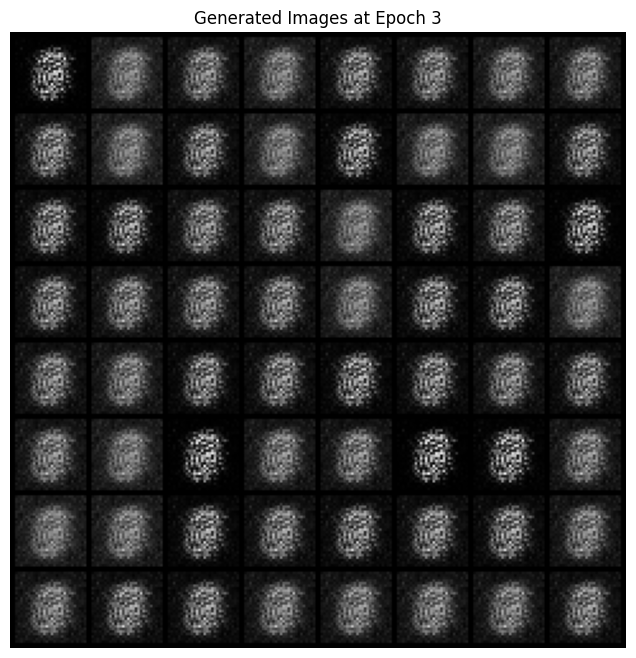

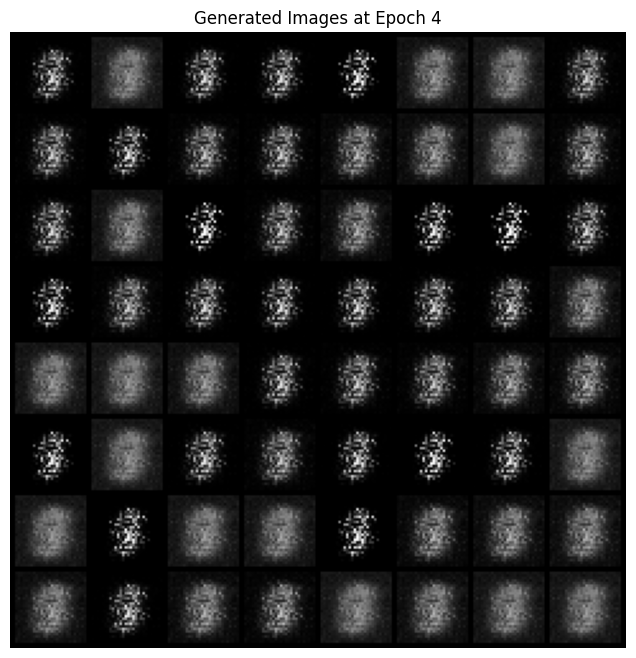

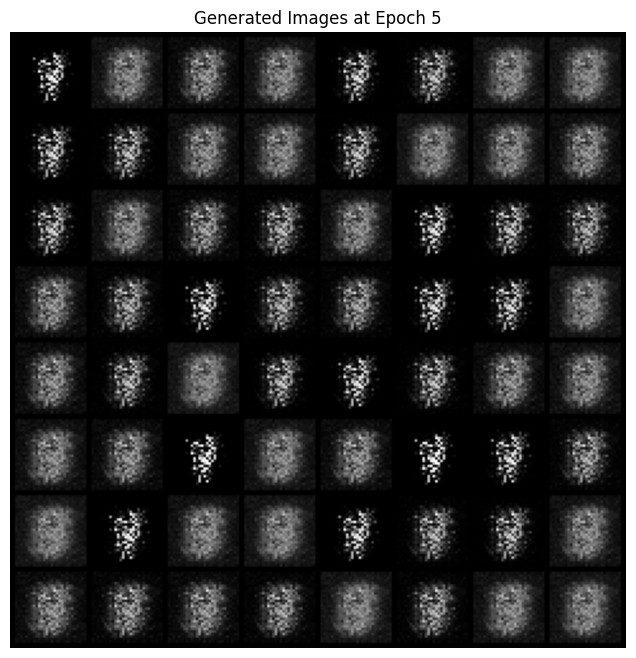

...

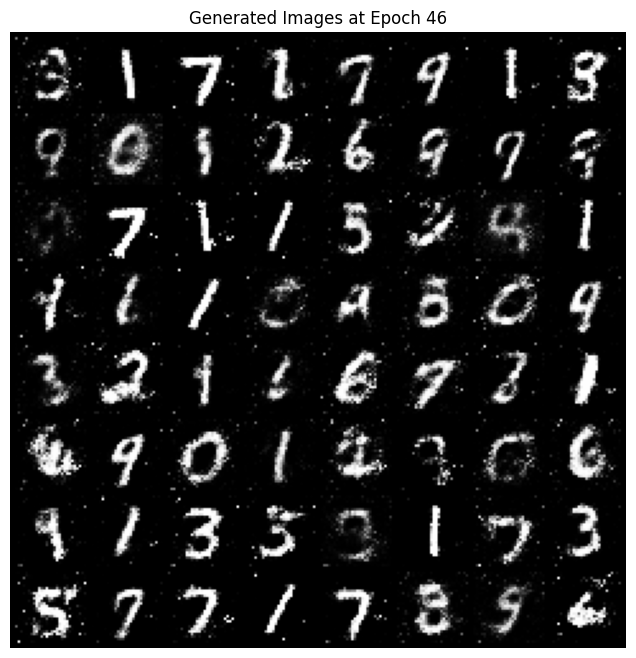

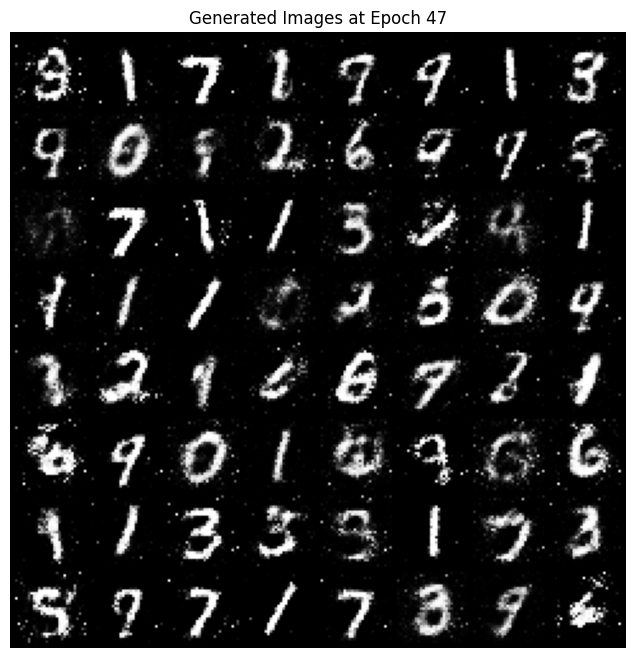

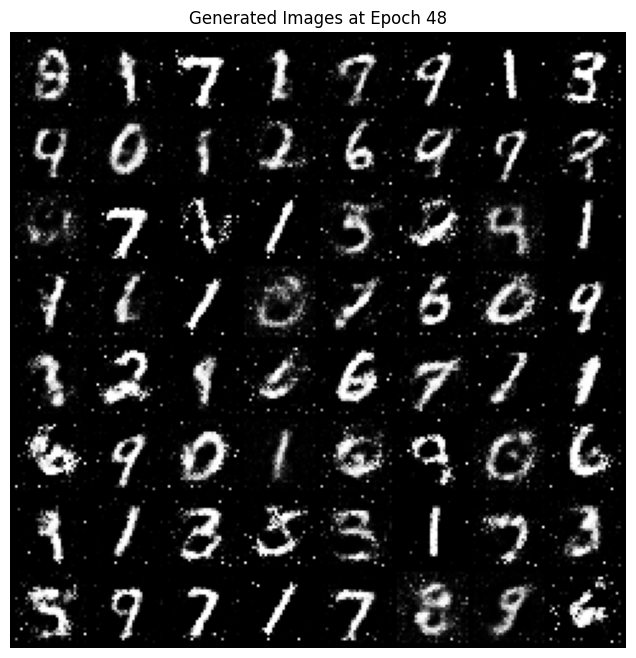

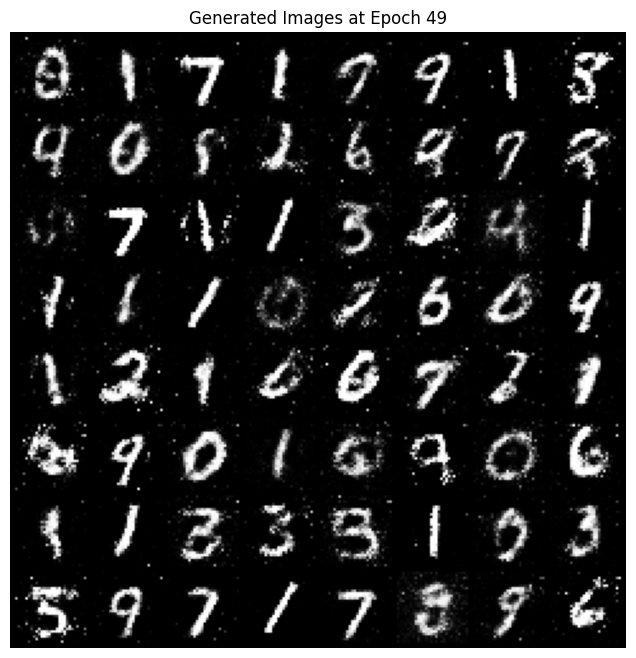

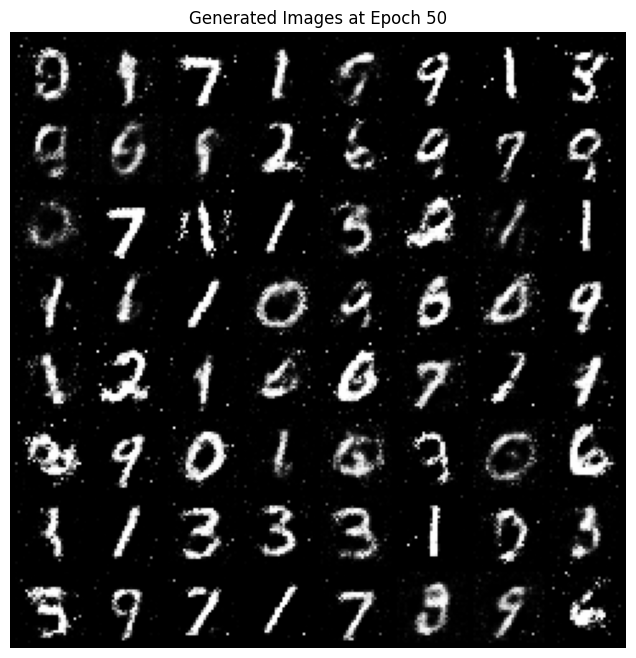

In [9]:
print("training: 1-step Gen, 1-step Dis")
train_gan(train_dataloader, num_epochs=50, mode="one_one")

# print("training: 5-step Gen, 1-step Dis")
# train_gan(train_dataloader, num_epochs=50, mode="five_gen_one_dis")

# print("training: 1-step Gen, 5-step Dis")
# train_gan(train_dataloader, num_epochs=50, mode="one_gen_five_dis")